In [2]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import dlib
import urllib.request

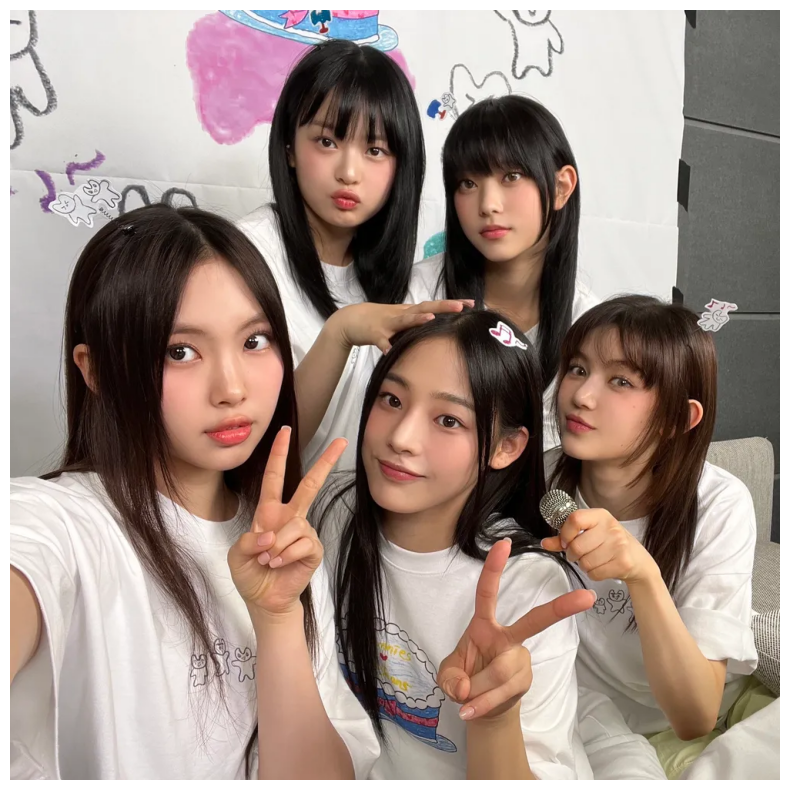

In [3]:

# 이미지 URL
url = "https://i.namu.wiki/i/0CgYU5VSFufGTtlw5sCu5PmNBSjncpe2DgV1dPHEdEvtNZu3cA56tvgxuLY4QU-G0izTGl35pTv7Ig-zG6sgyA.webp"

# User-Agent 헤더 추가
headers = {'User-Agent': 'Mozilla/5.0'}
req = urllib.request.Request(url, headers=headers)

# 이미지 다운로드
resp = urllib.request.urlopen(req)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
image = cv2.imdecode(image, cv2.IMREAD_COLOR)

# 이미지를 RGB로 변환
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_backup= image_rgb.copy()
# 이미지 출력
plt.figure(figsize=(19, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


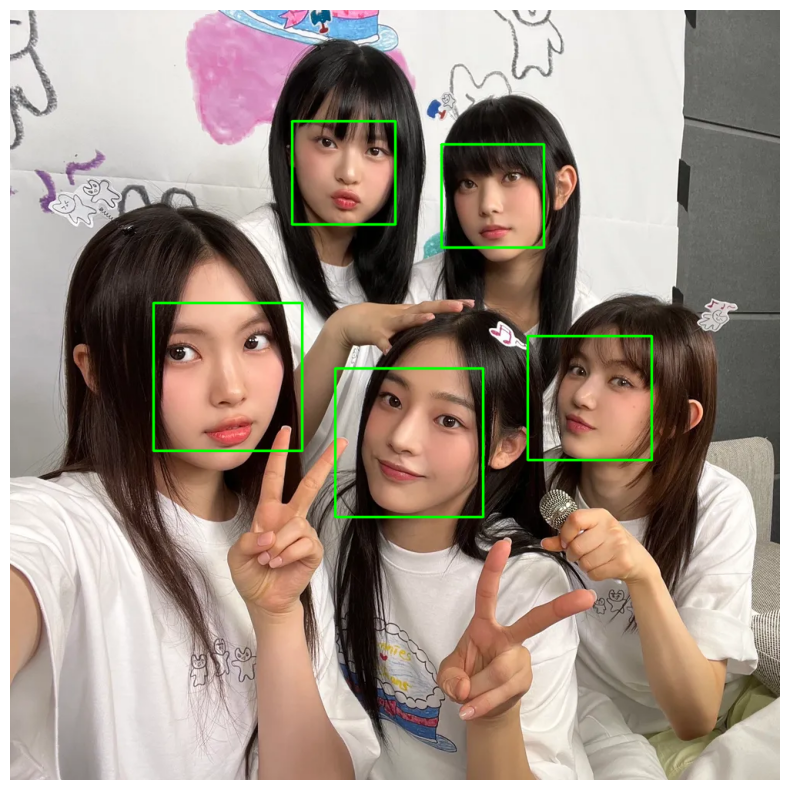

In [4]:

detector_hog = dlib.get_frontal_face_detector()

dlib_rects = detector_hog(image_rgb, 2) 

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    
    cv2.rectangle(image_rgb, (l, t), (r, b), (0, 255, 0), 2, lineType=cv2.LINE_AA)

plt.figure(figsize=(19, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


In [5]:
weight_path = 'shape_predictor_68_face_landmarks.dat'
predictor = dlib.shape_predictor(weight_path)

In [6]:
list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = predictor(image_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


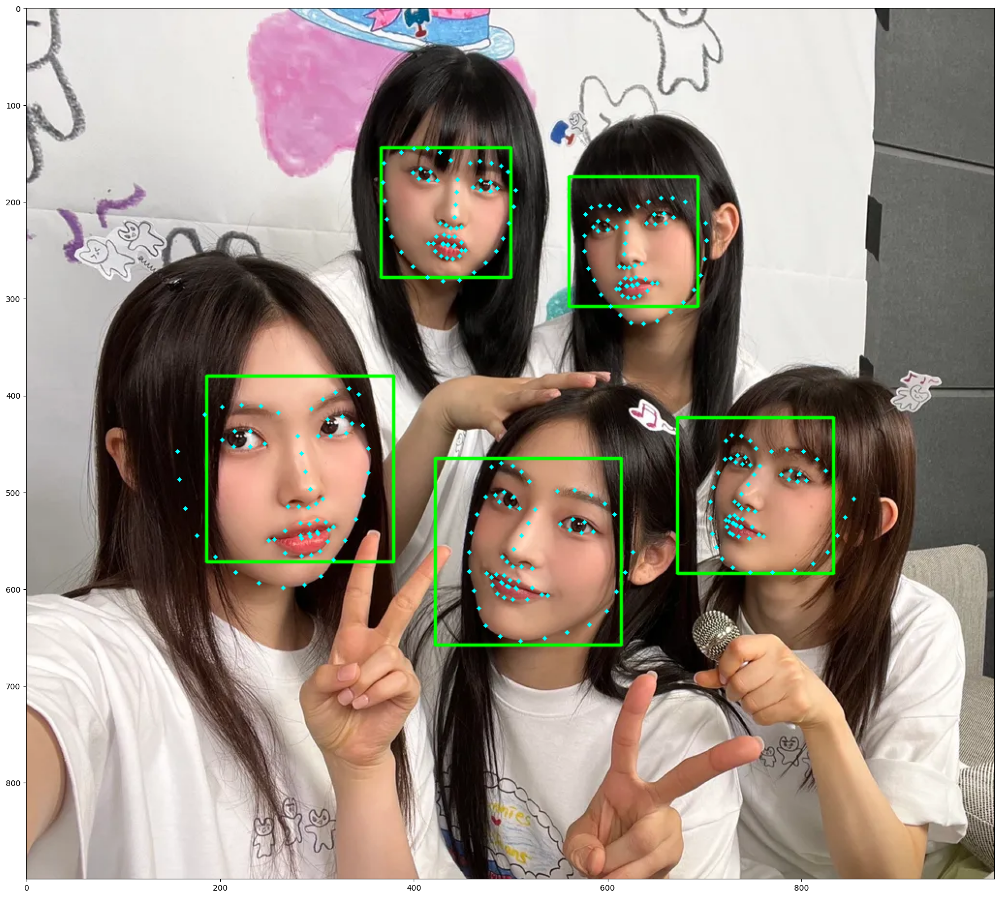

In [7]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(image_rgb, point, 2, (0, 255, 255), -1)

plt.figure(figsize=(38, 20))
plt.imshow(image_rgb[:900, :, :])
plt.show()

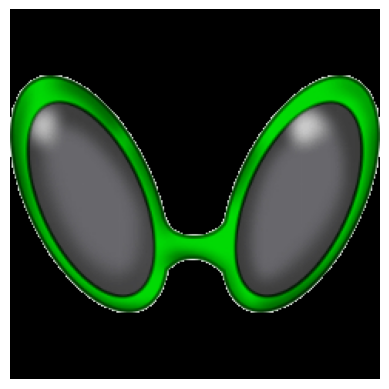

In [8]:
# 선글라스 이미지 불러오기
sunglass = cv2.imread('sunglass.png')  # 새로 업로드한 선글라스 이미지
sunglass = cv2.cvtColor(sunglass, cv2.COLOR_BGR2RGB)

# 흰색 배경을 투명하게 처리
sunglass_gray = cv2.cvtColor(sunglass, cv2.COLOR_RGB2GRAY)
_, mask = cv2.threshold(sunglass_gray, 240, 255, cv2.THRESH_BINARY_INV)
sunglass[np.where(mask == 0)] = 0

plt.imshow(sunglass)
plt.axis('off')
plt.show()

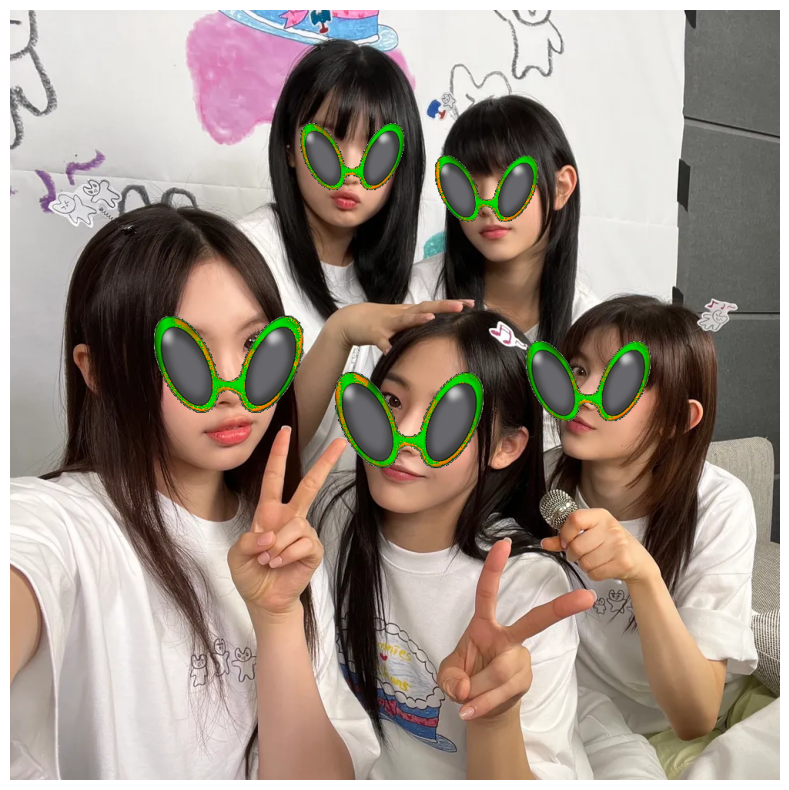

In [9]:
# 각 얼굴에 선글라스 합성하기
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    # 선글라스를 눈 위에 배치 (왼쪽 눈의 중심 기준)
    x = landmark[28][0]
    y = landmark[28][1]
    w = dlib_rect.width()
    h = w * sunglass.shape[0] // sunglass.shape[1]  # 선글라스의 비율 유지
    
    # 선글라스 크기 조정
    resized_sunglass = cv2.resize(sunglass, (w, h))
    
    # 선글라스 위치 계산
    refined_x = x - w // 2
    refined_y = y - h // 2

    
    # 이미지 경계 처리
    if refined_x < 0:
        resized_sunglass = resized_sunglass[:, -refined_x:]
        refined_x = 0
    if refined_y < 0:
        resized_sunglass = resized_sunglass[-refined_y:, :]
        refined_y = 0
    
    # 선글라스 합성
    sticker_area = image_backup[refined_y:refined_y + resized_sunglass.shape[0], refined_x:refined_x + resized_sunglass.shape[1]]
    image_backup[refined_y:refined_y + resized_sunglass.shape[0], refined_x:refined_x + resized_sunglass.shape[1]] = \
        np.where(resized_sunglass == 0, sticker_area, resized_sunglass).astype(np.uint8)

# 결과 이미지 출력
plt.figure(figsize=(19, 10))
plt.imshow(image_backup)
plt.axis('off')
plt.show()

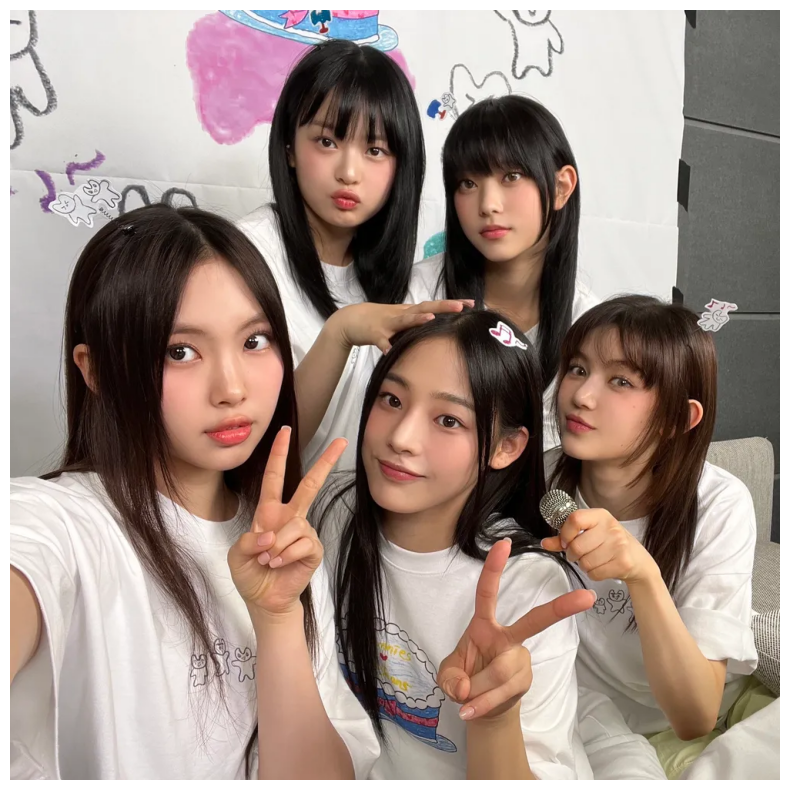

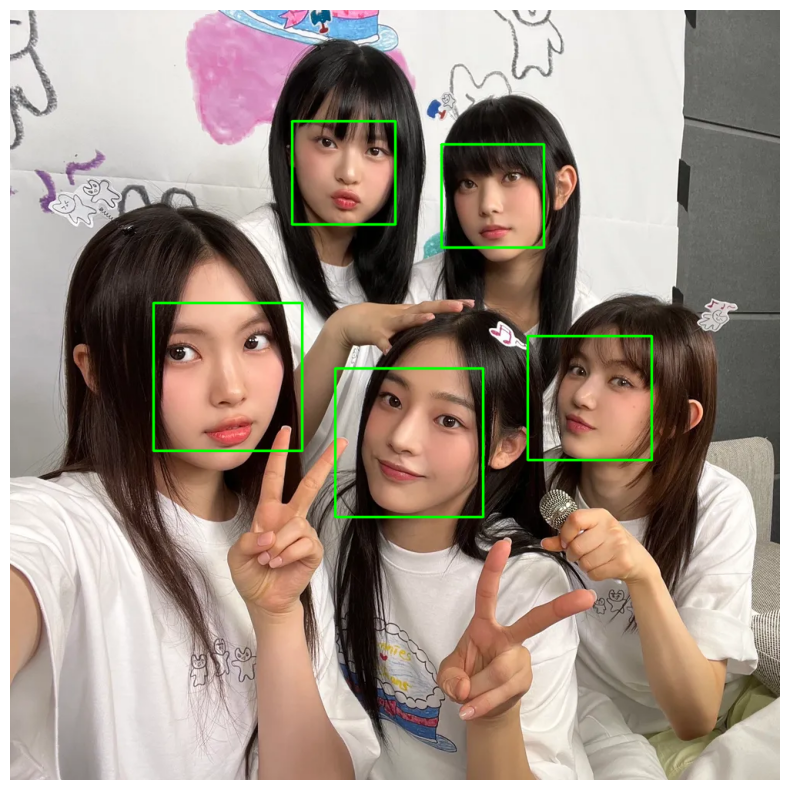

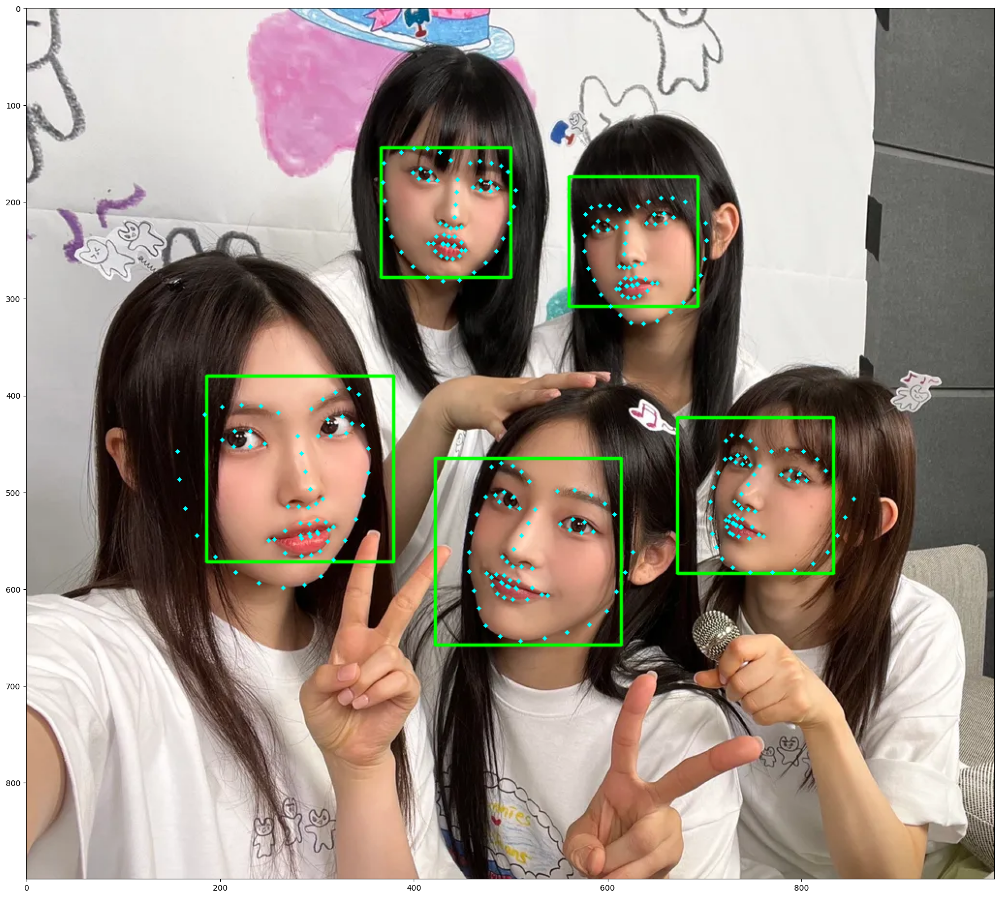

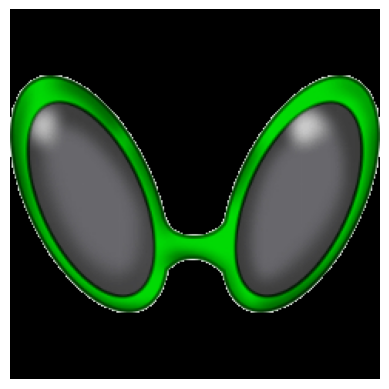

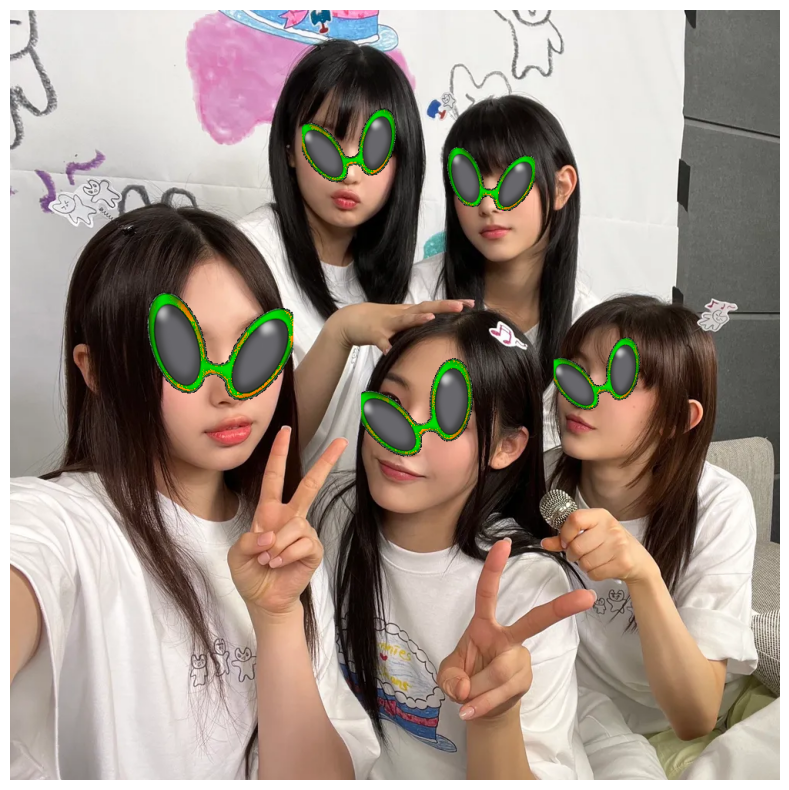

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import dlib
import urllib.request

# 이미지 URL
url = "https://i.namu.wiki/i/0CgYU5VSFufGTtlw5sCu5PmNBSjncpe2DgV1dPHEdEvtNZu3cA56tvgxuLY4QU-G0izTGl35pTv7Ig-zG6sgyA.webp"

# User-Agent 헤더 추가
headers = {'User-Agent': 'Mozilla/5.0'}
req = urllib.request.Request(url, headers=headers)

# 이미지 다운로드
resp = urllib.request.urlopen(req)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
image = cv2.imdecode(image, cv2.IMREAD_COLOR)

# 이미지를 RGB로 변환
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_backup = image_rgb.copy()

# 이미지 출력
plt.figure(figsize=(19, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

# HOG 기반 얼굴 탐지기 설정
detector_hog = dlib.get_frontal_face_detector()
dlib_rects = detector_hog(image_rgb, 2)

# 얼굴 영역에 사각형 그리기
for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()
    cv2.rectangle(image_rgb, (l, t), (r, b), (0, 255, 0), 2, lineType=cv2.LINE_AA)

plt.figure(figsize=(19, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

# 랜드마크 예측기 로드
weight_path = 'shape_predictor_68_face_landmarks.dat'
predictor = dlib.shape_predictor(weight_path)
list_landmarks = []

# 얼굴 영역 박스마다 랜드마크 추출
for dlib_rect in dlib_rects:
    points = predictor(image_rgb, dlib_rect)
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

# 랜드마크 표시
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(image_rgb, point, 2, (0, 255, 255), -1)

plt.figure(figsize=(38, 20))
plt.imshow(image_rgb[:900, :, :])
plt.show()

# 선글라스 이미지 불러오기
sunglass = cv2.imread('sunglass.png')  # 새로 업로드한 선글라스 이미지
sunglass = cv2.cvtColor(sunglass, cv2.COLOR_BGR2RGB)

# 흰색 배경을 투명하게 처리
sunglass_gray = cv2.cvtColor(sunglass, cv2.COLOR_RGB2GRAY)
_, mask = cv2.threshold(sunglass_gray, 240, 255, cv2.THRESH_BINARY_INV)
sunglass[np.where(mask == 0)] = 0

plt.imshow(sunglass)
plt.axis('off')
plt.show()

# 회전 각도 계산 함수
def calculate_rotation_angle(landmarks):
    left_eye_center = np.mean(landmarks[36:42], axis=0).astype("int")
    right_eye_center = np.mean(landmarks[42:48], axis=0).astype("int")
    delta_x = right_eye_center[0] - left_eye_center[0]
    delta_y = right_eye_center[1] - left_eye_center[1]
    angle = np.degrees(np.arctan2(delta_y, delta_x))
    return angle, left_eye_center, right_eye_center

# 각 얼굴에 선글라스 합성하기
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    angle, left_eye, right_eye = calculate_rotation_angle(landmark)
    
    # 선글라스 크기 조정
    w = int(np.linalg.norm(right_eye - left_eye) * 2)  # 눈 간격에 따라 선글라스 크기 결정
    h = int(w * sunglass.shape[0] / sunglass.shape[1])
    resized_sunglass = cv2.resize(sunglass, (w, h))
    
    # 선글라스 회전
    M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1)
    rotated_sunglass = cv2.warpAffine(resized_sunglass, M, (w, h))

    # 선글라스 위치 조정
    x = int((left_eye[0] + right_eye[0]) / 2 - w // 2)
    y = int((left_eye[1] + right_eye[1]) / 2 - h // 2)
    
    # 이미지 경계 처리
    if x < 0:
        rotated_sunglass = rotated_sunglass[:, -x:]
        x = 0
    if y < 0:
        rotated_sunglass = rotated_sunglass[-y:, :]
        y = 0
    
    # 선글라스 합성
    sticker_area = image_backup[y:y + rotated_sunglass.shape[0], x:x + rotated_sunglass.shape[1]]
    image_backup[y:y + rotated_sunglass.shape[0], x:x + rotated_sunglass.shape[1]] = \
        np.where(rotated_sunglass == 0, sticker_area, rotated_sunglass).astype(np.uint8)

# 결과 이미지 출력
plt.figure(figsize=(19, 10))
plt.imshow(image_backup)
plt.axis('off')
plt.show()


In [19]:
import cv2
import numpy as np
import dlib
import matplotlib.pyplot as plt

def calculate_rotation_angle(landmarks):
    left_eye_center = np.mean(landmarks[36:42], axis=0).astype("int")
    right_eye_center = np.mean(landmarks[42:48], axis=0).astype("int")
    nose_center = landmarks[28]
    delta_x = right_eye_center[0] - left_eye_center[0]
    delta_y = right_eye_center[1] - left_eye_center[1]
    angle = np.degrees(np.arctan2(delta_y, delta_x))
    return angle, left_eye_center, right_eye_center, nose_center

def warp_sunglass_to_face(sunglass, angle, eye_distance):
    # 크기 조정 및 회전
    h, w = sunglass.shape[:2]
    resize_width = int(eye_distance * 2)  # 정수형으로 변환
    resize_height = int(resize_width * h / w)  # 정수형으로 변환
    sunglass_resized = cv2.resize(sunglass, (resize_width, resize_height))
    M = cv2.getRotationMatrix2D((resize_width // 2, resize_height // 2), angle, 1)
    sunglass_rotated = cv2.warpAffine(sunglass_resized, M, (resize_width, resize_height))
    return sunglass_rotated

def make_background_transparent(image):
    # 흰색 배경을 투명하게 만들기
    # RGB 값을 기반으로 흰색을 검출
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, alpha = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY_INV)
    
    # 기존 이미지와 alpha 채널을 합성하여 투명 배경 이미지 생성
    b, g, r = cv2.split(image)
    rgba = [b, g, r, alpha]
    transparent_image = cv2.merge(rgba, 4)
    
    return transparent_image

# 이미지 로드 및 랜드마크 탐지
url = "https://i.namu.wiki/i/0CgYU5VSFufGTtlw5sCu5PmNBSjncpe2DgV1dPHEdEvtNZu3cA56tvgxuLY4QU-G0izTGl35pTv7Ig-zG6sgyA.webp"

# User-Agent 헤더 추가
headers = {'User-Agent': 'Mozilla/5.0'}
req = urllib.request.Request(url, headers=headers)

# 이미지 다운로드
resp = urllib.request.urlopen(req)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
image = cv2.imdecode(image, cv2.IMREAD_COLOR)

# 이미지를 RGB로 변환
image_rgb = cv2.cvtolor(image, cv2.COLOR_BGR2RGB)
image_backup = image_rgb.copy()

detector_hog = dlib.get_frontal_face_detector()
dlib_rects = detector_hog(image_rgb, 2)
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')
list_landmarks = [list(map(lambda p: (p.x, p.y), predictor(image_rgb, dlib_rect).parts())) for dlib_rect in dlib_rects]

sunglass = cv2.imread('sunglass.png')  # 선글라스 이미지 불러오기
sunglass = cv2.cvtColor(sunglass, cv2.COLOR_BGR2RGB)
sunglass_transparent = make_background_transparent(sunglass)  # 투명 배경 처리

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    angle, left_eye, right_eye, nose_center = calculate_rotation_angle(landmark)
    eye_distance = np.linalg.norm(right_eye - left_eye)
    
    # 선글라스 변형
    warped_sunglass = warp_sunglass_to_face(sunglass_transparent, angle, eye_distance)
    
    # 코 중앙에 위치시키기
    x = nose_center[0] - warped_sunglass.shape[1] // 2
    y = nose_center[1] - warped_sunglass.shape[0] // 2
    
    # 이미지 경계 처리
    if x < 0:
        warped_sunglass = warped_sunglass[:, -x:]
        x = 0
    if y < 0:
        warped_sunglass = warped_sunglass[-y:, :]
        y = 0
    
    # 선글라스 합성
    sticker_area = image_backup[y:y + warped_sunglass.shape[0], x:x + warped_sunglass.shape[1]]
    mask = warped_sunglass[:, :, 3] > 0  # 투명한 부분이 아닌 곳에만 합성
    sticker_area[mask] = warped_sunglass[mask][:, :3]
    image_backup[y:y + warped_sunglass.shape[0], x:x + warped_sunglass.shape[1]] = sticker_area

# 결과 출력
plt.figure(figsize=(19, 10))
plt.imshow(image_backup)
plt.axis('off')
plt.show()


AttributeError: module 'cv2' has no attribute 'cvtolor'

In [26]:
s= 'aukks'
index= 5
skip= 'wbqd'

In [27]:
keys= 'abcdefghijklmnopqrstuvwxyz'

count= 1
for x in s: 
    start= keys.index(x)
    end= keys.index(x)+index
    sml= keys[start:end+1]
    while count>0: 
        sml= keys[start:end+1+count]
        count= len(sml)+len(skip)-len(set(sml+skip))

    print(keys[start+1:end+1+count])

bcdefgh
vwxyz
lmnop
lmnop
tuvwxy
